In [34]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, precision_score

In [2]:
data_frame = pd.read_csv('https://simplonline-v3-prod.s3.eu-west-3.amazonaws.com/media/file/csv/4c343ce6-966b-4ba5-a4e9-16bdbd57c6b1.csv')

# 1. Réaliser l'analyse exploratoire des données

In [3]:
data_frame.head()


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [4]:
print('le shape:',data_frame.shape)

le shape: (569, 33)


In [5]:
data_frame_traitee = data_frame.drop(columns="Unnamed: 32")

In [6]:

data_frame_traitee.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


# 2. Visualiser les données

le shape: (569, 32)


array([[<AxesSubplot:title={'center':'id'}>,
        <AxesSubplot:title={'center':'radius_mean'}>,
        <AxesSubplot:title={'center':'texture_mean'}>,
        <AxesSubplot:title={'center':'perimeter_mean'}>,
        <AxesSubplot:title={'center':'area_mean'}>,
        <AxesSubplot:title={'center':'smoothness_mean'}>],
       [<AxesSubplot:title={'center':'compactness_mean'}>,
        <AxesSubplot:title={'center':'concavity_mean'}>,
        <AxesSubplot:title={'center':'concave points_mean'}>,
        <AxesSubplot:title={'center':'symmetry_mean'}>,
        <AxesSubplot:title={'center':'fractal_dimension_mean'}>,
        <AxesSubplot:title={'center':'radius_se'}>],
       [<AxesSubplot:title={'center':'texture_se'}>,
        <AxesSubplot:title={'center':'perimeter_se'}>,
        <AxesSubplot:title={'center':'area_se'}>,
        <AxesSubplot:title={'center':'smoothness_se'}>,
        <AxesSubplot:title={'center':'compactness_se'}>,
        <AxesSubplot:title={'center':'concavity_se'}>],

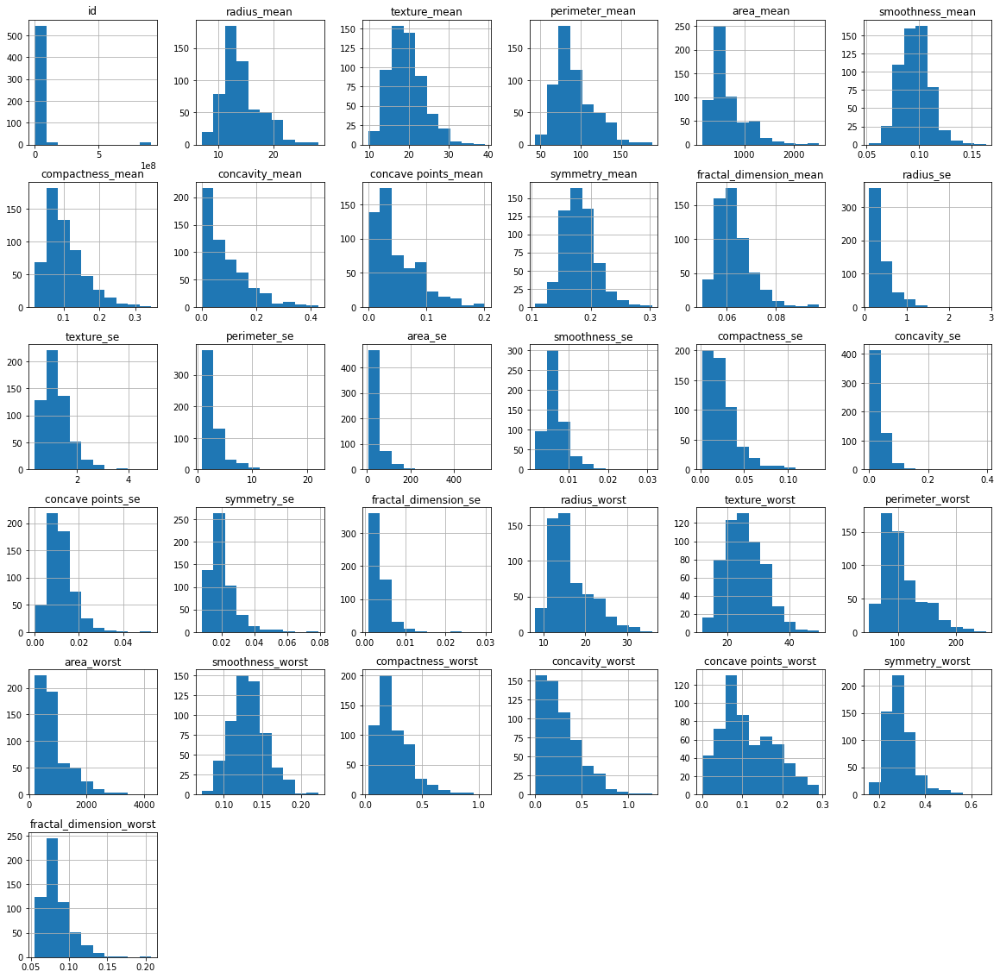

In [7]:

print('le shape:',data_frame_traitee.shape)
data_frame_traitee.hist(figsize=(20, 20))

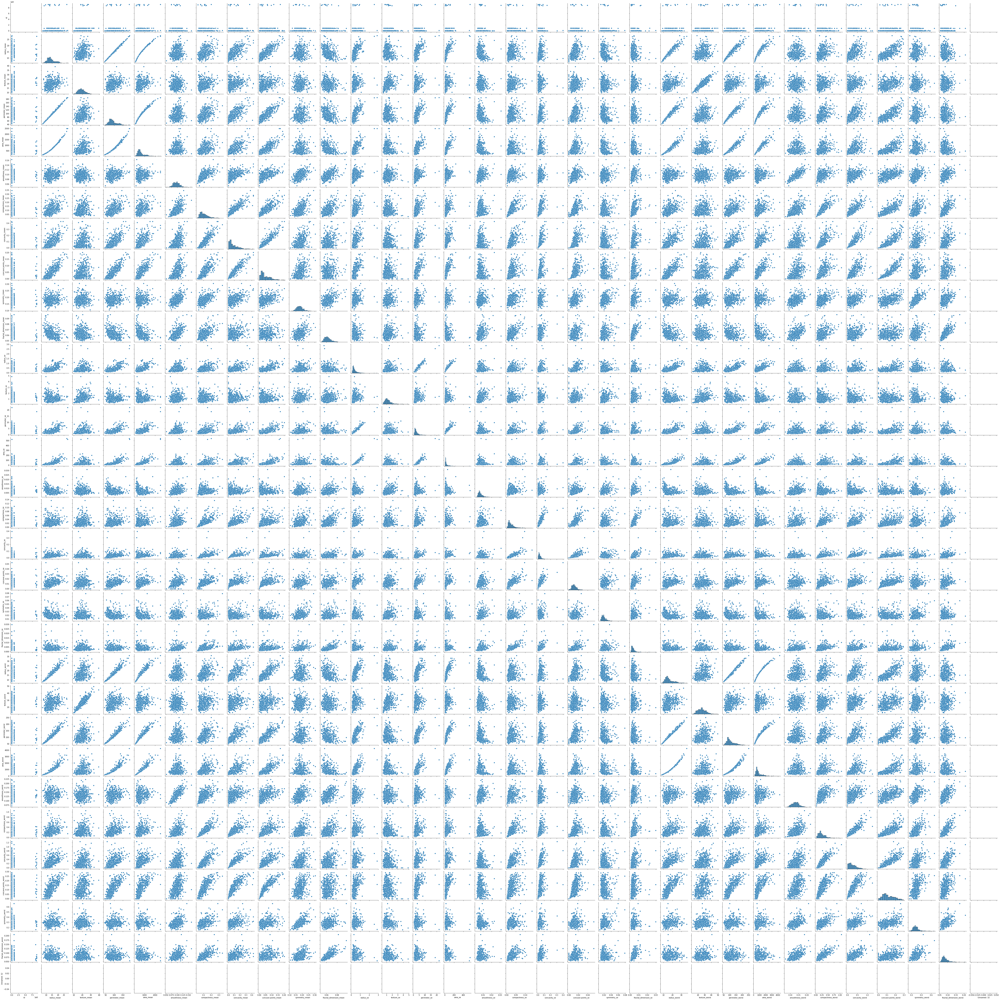

In [8]:

sns.pairplot(data_frame)

In [9]:
print('Les données unique :',data_frame_traitee['diagnosis'].unique() ) 

Les données unique : ['M' 'B']


# 3. Déclarer le vecteur de caractéristiques et la variable cible

In [10]:
#Division de la dataframe en data et target

data = data_frame_traitee[data_frame_traitee.columns[2:32]]
targets=data_frame_traitee['diagnosis']

In [11]:
print(82 * '_')
print('Shape du vecteur')
print(data.shape)
print(82 * '_')
print('vecteur de caractéristiques ')
print(82 * '_')
data.head()


__________________________________________________________________________________
Shape du vecteur
(569, 30)
__________________________________________________________________________________
vecteur de caractéristiques 
__________________________________________________________________________________


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [12]:


print(82 * '_')
print('shape de la cible')
print(targets.shape)
print(82 * '_')
print('la variable cible ')
print(targets.head())

__________________________________________________________________________________
shape de la cible
(569,)
__________________________________________________________________________________
la variable cible 
0    M
1    M
2    M
3    M
4    M
Name: diagnosis, dtype: object


# 4. Divisez les données en un ensemble d'entraînement et de test séparé

In [13]:
# Division de mes données en train et test

X_train, X_test, Y_train, Y_test = train_test_split(data, targets, train_size=0.8, random_state=42)

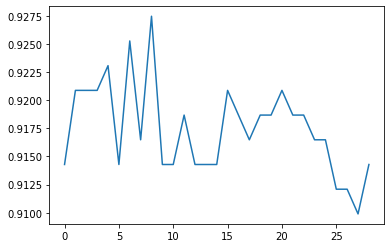

In [41]:
val_score=[]
for k in range(1,30):
    score = cross_val_score(KNeighborsClassifier(k), X_train, Y_train, cv=5,scoring='accuracy').mean()
    val_score.append(score)
plt.plot(val_score)

# 5. Feature engineering

processus de transformation des données brutes en fonctionnalités utiles qui nous aident à mieux comprendre notre modèle et à augmenter sa puissance prédictive : tips : utiliser .isnull().sum()
Nous supposons que des données sont manquantes aléatoirement. Deux méthodes peuvent être utilisées pour imputer les valeurs manquantes. L'une est l'imputation moyenne ou médiane et l'autre est l'imputation par échantillon aléatoire. Lorsqu'il y a des valeurs aberrantes dans l'ensemble de données, nous devrions utiliser l'imputation médiane. Vous pouvez donc utiliser des mécanismes d'imputation médiane parce que l'imputation médiane est robuste aux valeurs aberrantes. L'imputation doit être effectuée sur l'ensemble d'apprentissage, puis propagée vers l'ensemble de test. Cela signifie que les mesures statistiques à utiliser pour remplir les valeurs manquantes à la fois dans le train et dans l'ensemble d'essai doivent être extraites de l'ensemble de train uniquement. Ceci pour éviter le surajustement.


In [33]:
print('Données X_train')
print(82 * '_')
print(X_train.isnull().sum())
print(82 * '_')
print('Données X_test')
print(82 * '_')
print(X_test.isnull().sum())
print(82 * '_')


Données X_train
__________________________________________________________________________________
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64
__________________

# 6. Feature scaling

In [66]:
# standard scaller
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc.fit(X_train)
X_train_sc = sc.transform(X_train)
X_test_sc = sc.transform(X_test)

# 7. Ajuster le classificateur à l'ensemble d'entraînement

In [104]:
from sklearn import neighbors
from sklearn.neighbors import KNeighborsClassifier
knn = neighbors.KNeighborsClassifier(n_neighbors=11)
knn.fit(X_train, Y_train)


knn.score(X_test, Y_test)
error = 1 - knn.score(X_test, Y_test)
print('Score :', 100*knn.score(X_test, Y_test), '%')
print("L'erreur est a :", 100*error, '%')


Score : 98.24561403508771 %
L'erreur est a : 1.7543859649122862 %


In [ ]:
from sklearn.metrics import roc_curve
y_pred_1 = knn.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(Y_test, y_pred_1, pos_label=4)
plt.figure(figsize=(6,4))

plt.plot(fpr, tpr, linewidth=2)

# 8 Prédire les résultats du test (predict() et predict_proba())

In [73]:
y_pred = knn.predict(X_test)
y_pred_proba = knn.predict_proba(X_test)
print('Ma prédiction avec predict()')
print(y_pred[:10])
print(82 * '_')
print('Ma prédiction avec predict_proba')
print(50 * '_')
print(y_pred_proba[:10])

Ma prédiction avec predict()
['B' 'M' 'M' 'B' 'B' 'M' 'M' 'M' 'B' 'B']
__________________________________________________________________________________
Ma prédiction avec predict_proba
__________________________________________________
[[0.81818182 0.18181818]
 [0.         1.        ]
 [0.         1.        ]
 [1.         0.        ]
 [1.         0.        ]
 [0.         1.        ]
 [0.         1.        ]
 [0.09090909 0.90909091]
 [1.         0.        ]
 [0.90909091 0.09090909]]


# 9. Score de precision

In [77]:
# Label encoding sur Y 

from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
encoder.fit_transform(Y_test)
encoder_pred = LabelEncoder()
encoder_pred.fit_transform(y_pred)

print('Mon score de précision  est de :', precision_score(encoder.fit_transform(y_pred), encoder_pred.fit_transform(y_pred)))

Mon score de précision  est de : 1.0


In [79]:
knn_3 = KNeighborsClassifier(n_neighbors=11)
knn_3.fit(X_train,Y_train)
print('Sans Standard Scaler', knn.score(X_test, Y_test))
knn_3.fit(X_train_sc, Y_train)
print('Avec Standard Scaler', knn.score(X_test_sc, Y_test))

Sans Standard Scaler 0.9824561403508771
Avec Standard Scaler 0.6228070175438597


# 10. Reconstruire le modèle de classification kNN en utilisant différentes valeurs de k

<function matplotlib.pyplot.show(close=None, block=None)>

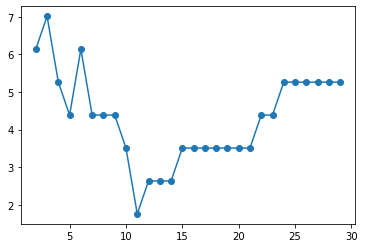

In [42]:
errors=[]
for k in range(2,30):
    knn = neighbors.KNeighborsClassifier(k)
    errors.append(100*(1 - knn.fit(X_train, Y_train).score(X_test, Y_test)))
plt.plot(range(2,30), errors, 'o-')
plt.show

In [93]:
var = int(input())
knn_4 = neighbors.KNeighborsClassifier(n_neighbors=var)
knn_4.fit(X_train, Y_train)


print("La valeur du score est de :", knn.score(X_test, Y_test))



8
La valeur du score est de : 0.9824561403508771


# 11. Matrice de confusion

In [60]:
print('La matrice de confusion')
print( confusion_matrix(Y_test, y_pred))


La matrice de confusion
[[71  0]
 [ 6 37]]


# 12. Métriques de classification

In [28]:
target_names = ['Bénignes', 'Malignes']
print(classification_report(Y_test, y_pred, target_names=target_names))

              precision    recall  f1-score   support

    Bénignes       0.92      1.00      0.96        71
    Malignes       1.00      0.86      0.92        43

    accuracy                           0.95       114
   macro avg       0.96      0.93      0.94       114
weighted avg       0.95      0.95      0.95       114



# 13. ROC - AUC

<function matplotlib.pyplot.show(close=None, block=None)>

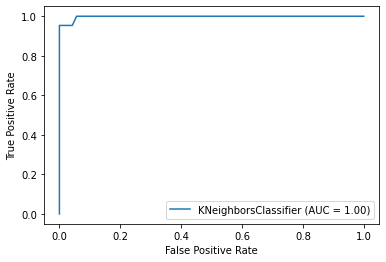

In [96]:
from sklearn.metrics import roc_auc_score, plot_roc_curve
plot_roc_curve(knn,X_test, Y_test)
plt.show

# 14. Utiliser la validation croisée K-Fold 

In [37]:
cross_val_score(KNeighborsClassifier(), X_train, Y_train, cv=5,scoring='accuracy').mean()

0.9230769230769231